In [1]:
import gymnasium as gym
import aero_gym
from aero_gym.wrappers import ResetOptions
from stable_baselines3.common.env_checker import check_env
from gymnasium.wrappers import FrameStack, FlattenObservation, RescaleAction
import math
import numpy as np
import stable_baselines3
from stable_baselines3 import TD3, DQN, PPO
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack, VecTransposeImage
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.transforms import Affine2D
from typing import Any, Dict
from pathlib import Path
from copy import deepcopy
import json
import importlib

# from control import tf, feedback, step_response, c2d

In [2]:
def animaterender(filename, render_list, pivot_idx, label='', subplot_kw=None, fig_kw=None, show_inflow=False, quiver_kw=None, animate_every=10):
    with open(filename, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        alpha_ddot_list = [float(x[6]) for x in all_lines]
        fy_hist = [float(x[7]) for x in all_lines]
        readFile.close()
        
    fig, ax = plt.subplots(subplot_kw=subplot_kw, **fig_kw);  
    im = ax.imshow(render_list[0][:,:,0]);
    if show_inflow:
        Q = ax.quiver(*pivot_idx, 1.0, -h_dot_list[i], **quiver_kw)

    def animate(i):
        im.set_array(render_list[i][:,:,0])
        im.set_transform(Affine2D().rotate_deg_around(*pivot_idx, alpha_list[i] * 180 / np.pi) + plt.gca().transData)
        if show_inflow:
            Q.set_UVC(1.0, -h_dot_list[i])

    # anim = matplotlib.animation.FuncAnimation(fig, animate, frames=len(render_list))
    # anim.save(tmp_dir + 'testlog_impulse.gif', fps=20)
    anim = matplotlib.animation.FuncAnimation(fig, animate, frames=range(0, len(render_list), animate_every))

    return anim

In [3]:
def animaterender_contour(filename, xg, yg, render_list, pivot_idx, label='', subplot_kw={}, fig_kw={}, show_inflow=False, quiver_kw=None, animate_every=10, interval=200, alpha_init=0):
    with open(filename, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        alpha_ddot_list = [float(x[6]) for x in all_lines]
        fy_hist = [float(x[7]) for x in all_lines]
        readFile.close()
        
    fig, ax = plt.subplots(subplot_kw=subplot_kw, **fig_kw); 
    ax.axis('scaled')
    cont = ax.contour(xg[3:-3], yg[3:-3], render_list[0][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');

    def animate(i):
        ax.clear()
        cont = plt.contour(xg[3:-3], yg[3:-3], render_list[i][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
        for c in cont.collections:
            c.set_transform(Affine2D().rotate_deg_around(*pivot_idx, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
        plate, = ax.plot([-0.5,0.5],[0,0],c='black',lw=3)
        plate.set_transform(Affine2D().rotate_deg_around(*pivot_idx, (-alpha_init - alpha_list[i]) * 180 / np.pi) + plt.gca().transData)
#         text = ax.text(-0.75,-0.4,"$t^* = {t}$".format(t=t_hist[i]))

    anim = matplotlib.animation.FuncAnimation(fig, animate, frames=range(0, len(render_list), animate_every), interval=interval)

    return anim

In [4]:
import sys
sys.path.append('../aero_gym_SB3/')
import trajectory_generators

In [5]:
writedir = "policy_evaluation"
Path(writedir).mkdir(parents=True, exist_ok=True)

In [6]:
class PI:
    def __init__(self, Kp, Ki, Ts):
        self.Kp = Kp
        self.Ki = Ki
        self.Ts = Ts
        self._integral_error = 0.0
    
    def predict(self, info, **kwargs):
        self._integral_error += info["previous scaled fy_error"] * self.Ts
        u = self.Kp * info["previous scaled fy_error"] + self.Ki * self._integral_error
        return [u]
    
class PrescribedAction:
    def __init__(self, alpha_ddot_prescribed):
        self.alpha_ddot_prescribed = alpha_ddot_prescribed
    
    def predict(self, info, **kwargs):
        timestep = info["time_step"]
        return [self.alpha_ddot_prescribed[timestep]]

In [7]:
class Case:
    
    valid_options = [
        'use_discrete_action',
        'num_discrete_actions',
        'delta_t',
        't_max',
        'rho',
        'U',
        'c',
        'a',
        'reward_type',
        'observe_h_ddot',
        'observe_previous_lift',
        'observe_previous_lift_error',
        'observe_previous_pressure',
        'observe_vorticity_field',
        'pressure_sensor_positions',
        'lift_termination',
        'lift_scale',
        'alpha_ddot_scale',
        'h_ddot_scale',
#         'vorticity_scale',
        'lift_upper_limit',
        'lift_lower_limit',
        'xlim',
        'ylim',
        'alpha_init',
        'initialization_time',
        ]
    
    def __init__(self, name, policy, options_dict, json_file):
        self.name = name
        self.policy = policy
        self.options_dict = options_dict
        self.stacked_frames = 1
        if json_file is not None:
            with open(json_file) as jf:
                json_dict = json.load(jf)
            # add parameters from json_file to options but don't overwrite any
            for k,v in json_dict.items():
                if k not in self.options_dict.keys() and k in self.valid_options:
                    self.options_dict[k] = v
            
            if json_dict["algorithm"] in ["TD3", "PPO"]:
                self.options_dict["use_discrete_actions"] = False

            if "stacked_frames" in json_dict:
                self.stacked_frames = json_dict["stacked_frames"]
            
            print(self.options_dict)
            
    def create_env(self, h_ddot_prescribed=None, reference_lift_prescribed=None):
        env = gym.make(
            'aero_gym/viscous_flow-v0',
            render_mode="grayscale_array",
            lift_termination=False,
            h_ddot_prescribed=h_ddot_prescribed,
            reference_lift_prescribed=reference_lift_prescribed,
            vorticity_scale=5,
            **self.options_dict)
        return env

In [8]:
def no_action_policy(observation):
    return [0.0]

In [28]:
# logdir = 'viscous_flow_test_16_vortex_shedding'
# logdir = '/viscous_flow_test_15_point_force'
logdir = 'viscous_flow_test_11_random_ramps'
parentdir = '/u/home/b/beckers/project-sofia/unsteady_aero_RL/logs/' + logdir

In [51]:
cases = [
#     Case('TD3_pressure_7_4_new', TD3.load(parentdir + "/TD3_pressure_7_4/TD3_1/best_model"), {}, parentdir + "/TD3_pressure_7_4/TD3_1/case_args.json"), # for point force
#     Case('TD3_pressure_7_4', TD3.load(parentdir + "/TD3_pressure_7_4/TD3_1/best_model"), {}, parentdir + "/TD3_pressure_7_4/TD3_1/case_args.json"), # for vortex shedding
    Case('TD3_pressure_7_4', TD3.load(parentdir + "/TD3_pressure_4_4/TD3_1/best_model"), {'alpha_init':0}, parentdir + "/TD3_pressure_4_4/TD3_1/case_args.json"), # for vortex shedding
#     Case('naive', PrescribedAction(alpha_ddot_naive / alpha_ddot_scale), {"alpha_ddot_scale":alpha_ddot_scale}, parentdir + "/TD3_pressure_4_4/TD3_1/case_args.json"),    
    Case('no_controller', PI(0, 0, 0.1), {'alpha_init':0}, parentdir + "/TD3_pressure_4_4/TD3_1/case_args.json"),
#     Case('no_controller_lower_angle', PI(0, 0, 0.1), {'alpha_init':0.52356-0.05}, parentdir + "/TD3_pressure_7_4/TD3_1/case_args.json"),
]

{'alpha_init': 0, 'delta_t': 0.01, 't_max': 20.0, 'xlim': [-0.75, 2.0], 'ylim': [-0.5, 0.5], 'num_discrete_actions': 9, 'reward_type': 4, 'observe_vorticity_field': False, 'observe_h_ddot': False, 'observe_previous_lift': True, 'observe_previous_lift_error': True, 'observe_previous_pressure': True, 'lift_scale': 0.1, 'lift_upper_limit': 0.4, 'lift_lower_limit': -0.4, 'alpha_ddot_scale': 10.0, 'h_ddot_scale': 1.0, 'pressure_sensor_positions': [-0.3, -0.2, -0.1, 0.0, 0.1, 0.2, 0.3], 'use_discrete_actions': False}
{'alpha_init': 0, 'delta_t': 0.01, 't_max': 20.0, 'xlim': [-0.75, 2.0], 'ylim': [-0.5, 0.5], 'num_discrete_actions': 9, 'reward_type': 4, 'observe_vorticity_field': False, 'observe_h_ddot': False, 'observe_previous_lift': True, 'observe_previous_lift_error': True, 'observe_previous_pressure': True, 'lift_scale': 0.1, 'lift_upper_limit': 0.4, 'lift_lower_limit': -0.4, 'alpha_ddot_scale': 10.0, 'h_ddot_scale': 1.0, 'pressure_sensor_positions': [-0.3, -0.2, -0.1, 0.0, 0.1, 0.2, 0.3

In [13]:
cases_delta_t = np.array([case.options_dict["delta_t"] for case in cases])
if np.all(cases_delta_t == cases_delta_t[0]):
    delta_t = cases_delta_t[0]
else:
    delta_t = None
cases_t_max = np.array([case.options_dict["t_max"] for case in cases])
if np.all(cases_t_max == cases_t_max[0]):
    t_max = cases_t_max[0]
else:
    t_max = None

In [14]:
# model parameters
U = 1.0;
c = 1.0;
d = 0.0;

# # signal scaling factors
# alphaddot_max = 0.1;
# hddot_max = 0.1;
# e_max = 0.1;

# time parameters
t = np.linspace(0, t_max, int(t_max/delta_t)+1)

In [15]:
env_for_trajectory_generation = gym.make(
    'aero_gym/viscous_flow-v0',
    t_max=t_max,
    delta_t=delta_t,
    a=d,
    initialization_time=0.0,
    );

`lift_upper_limit` and/or `lift_lower_limit` not provided, setting limits to plus and minus `lift_scale`


/u/home/b/beckers/unsteady_aero_RL/gymnasium_28/env_gymnasium_28/lib/python3.9/site-packages/julia/core.py:709: FutureWarning: Accessing `Julia().<name>` to obtain Julia objects is deprecated.  Use `from julia import Main; Main.<name>` or `jl = Julia(); jl.eval('<name>')`.
  warnings.warn(


nt_opt = 12
nt_opt = 12
nt_opt = 12
Flow solver timestep: delta_t = 0.01
Setting environment timestep to multiple of flow solver timestep: delta_t = 0.01


In [16]:
importlib.reload(trajectory_generators)

<module 'trajectory_generators' from '/u/home/b/beckers/unsteady_aero_RL/notebooks/../aero_gym_SB3/trajectory_generators.py'>

procs -----------memory---------- ---swap-- -----io---- -system-- ------cpu-----
 r  b   swpd   free   buff  cache   si   so    bi    bo   in   cs us sy id wa st
 2  0      0 132268944 455564 36823020    0    0     0    35    1    1  1  0 98  0  0
nt_opt = 12


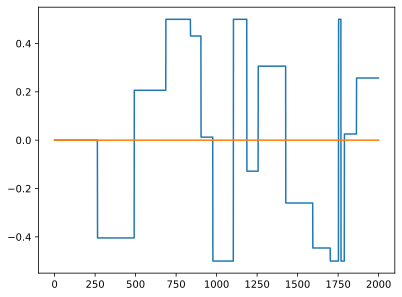

In [39]:
# episode type
h_ddot_generator = trajectory_generators.random_d_ramps(max_d_amplitude=0.5)
# h_ddot_generator = trajectory_generators.constant(0.0)
# reference_lift_generator = trajectory_generators.constant(0.7)
reference_lift_generator = trajectory_generators.constant(0.0)
sys_reinit_commands = None
# sys_reinit_commands = '/u/home/b/beckers/unsteady_aero_RL/aero_gym_SB3/julia_system_with_forcing.jl'

env_for_trajectory_generation.reset(options={"h_ddot_generator":h_ddot_generator,"reference_lift_generator":reference_lift_generator})
generated_h_ddot_list = deepcopy(env_for_trajectory_generation.h_ddot_list)
generated_reference_lift_list = deepcopy(env_for_trajectory_generation.reference_lift_list)
plt.figure()
plt.plot(generated_h_ddot_list)
plt.plot(generated_reference_lift_list)

In [19]:
# delta_t = delta_t
# alpha_ddot_scale = 10
# alpha_dot_limit = 1.999

# alpha_ddot_naive = np.zeros_like(generated_h_ddot_list)
# alpha_dot_naive = np.zeros_like(generated_h_ddot_list)
# alpha_naive = np.zeros_like(generated_h_ddot_list)
# alpha_naive_target = np.zeros_like(generated_h_ddot_list)
# alpha_dot_naive_target = np.zeros_like(generated_h_ddot_list)
# alpha_ddot_naive_target = np.zeros_like(generated_h_ddot_list)


# h_dot = np.zeros_like(generated_h_ddot_list)


# for i in range(len(generated_h_ddot_list) - 2):
#     h_dot[i + 2:] += generated_h_ddot_list[i+1] * delta_t
#     alpha_naive_target[i+2] = math.atan(h_dot[i + 2]) - alpha_naive[i + 2]
#     alpha_dot_naive_target[i+1] = min(max(alpha_naive_target[i + 2] / delta_t - alpha_dot_naive[i + 1], -alpha_dot_limit - alpha_dot_naive[i+1]), alpha_dot_limit - alpha_dot_naive[i+1])
#     alpha_ddot_naive_target[i] = min(max(alpha_dot_naive_target[i + 1] / delta_t, -alpha_ddot_scale), alpha_ddot_scale)
#     alpha_ddot_naive[i] = alpha_ddot_naive_target[i]
#     alpha_dot_naive[i + 1:] += alpha_ddot_naive[i] * delta_t
#     alpha_naive[i + 2:] += alpha_dot_naive[i+1] * delta_t

In [20]:
# plt.plot(alpha_naive_target)

In [21]:
# plt.plot(alpha_dot_naive)

In [22]:
# plt.plot(alpha_ddot_naive)

In [40]:
renders_dict = {}

for case in cases:
    print(case.options_dict)
    filepath = writedir + "/" + logdir + "_" + case.name + ".txt"
    
    env = case.create_env(h_ddot_prescribed=generated_h_ddot_list, reference_lift_prescribed=generated_reference_lift_list)
    env = ResetOptions(env, {"sys_reinit_commands": sys_reinit_commands})
    
    # recreate wrappers used in training
    env = Monitor(env)
    env = DummyVecEnv([lambda: env])
    env = VecFrameStack(env, case.stacked_frames)
    if case.options_dict["observe_vorticity_field"]:
        env = VecTransposeImage(env)

    render_list = []
    writefile = open(filepath, "w")
        
    # Note that infos from DummyVecEnv is stored in reset_infos instead of being returned by reset
    observation = env.reset()
    infos = env.unwrapped.reset_infos
    done = False
    episode_return = 0
    while done == False:
        render_list.append(env.unwrapped.envs[0].render())
        info = infos[0]
        print(info["time_step"])
        writestr = ("{:5d}" + "{:11.5f}" + "{:11.3e} " * 5).format(
            info["time_step"], 
            info["t"], 
            info["scaled h_dot"] * env.unwrapped.envs[0].h_dot_scale, 
            info["scaled alpha"] * env.unwrapped.envs[0].alpha_scale,
            info["scaled alpha_dot"] * env.unwrapped.envs[0].alpha_dot_scale, 
            info["scaled h_ddot"] * env.unwrapped.envs[0].h_ddot_scale, 
            info["scaled reference_lift"] * env.unwrapped.envs[0].lift_scale)
        if isinstance(case.policy,  stable_baselines3.common.base_class.BaseAlgorithm):
            action = case.policy.predict(observation, deterministic=True)
        else:
            action = [case.policy.predict(info)]
        if isinstance(action, tuple):
            action = action[0]
        # Note that step from DummyVecEnv returns done instead of terminated and truncated
        observation, rewards, dones, infos = env.step(action)
        episode_return += rewards[0]
        writestr += ("{:11.3e} " * 4).format(
            infos[0]["previous scaled alpha_ddot"] * env.unwrapped.envs[0].alpha_ddot_scale, 
            infos[0]["previous scaled fy"] * env.unwrapped.envs[0].lift_scale, 
            rewards[0], 
            episode_return)
        writefile.write(writestr + "\n")
        done = dones[0]
    writefile.close()
    renders_dict[case.name] = deepcopy(render_list)

{'delta_t': 0.01, 't_max': 20.0, 'xlim': [-0.75, 2.0], 'ylim': [-0.5, 0.5], 'num_discrete_actions': 9, 'reward_type': 4, 'observe_vorticity_field': False, 'observe_h_ddot': False, 'observe_previous_lift': True, 'observe_previous_lift_error': True, 'observe_previous_pressure': True, 'lift_scale': 0.1, 'lift_upper_limit': 0.4, 'lift_lower_limit': -0.4, 'alpha_ddot_scale': 10.0, 'h_ddot_scale': 1.0, 'pressure_sensor_positions': [-0.3, -0.2, -0.1, 0.0, 0.1, 0.2, 0.3], 'use_discrete_actions': False}
nt_opt = 12
nt_opt = 12
nt_opt = 12Flow solver timestep: delta_t = 0.01
Setting environment timestep to multiple of flow solver timestep: delta_t = 0.01

procs -----------memory---------- ---swap-- -----io---- -system-- ------cpu-----
 r  b   swpd   free   buff  cache   si   so    bi    bo   in   cs us sy id wa st
 3  0      0 132254304 455568 36823208    0    0     0    35    1    1  1  0 98  0  0
nt_opt = 120

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31


1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1716
1717
1718
1719
1720
1721
1722
1723
1724
1725
1726
1727
1728
1729
1730
1731
1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
1771
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826
1827
1828
1829
1830
1831
1832
1833
1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1844
1845
1846
1847
1848
1849
1850
1851
1852
1853
1854
1855
1856
1857
1858
1859
1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879


1307
1308
1309
1310
1311
1312
1313
1314
1315
1316
1317
1318
1319
1320
1321
1322
1323
1324
1325
1326
1327
1328
1329
1330
1331
1332
1333
1334
1335
1336
1337
1338
1339
1340
1341
1342
1343
1344
1345
1346
1347
1348
1349
1350
1351
1352
1353
1354
1355
1356
1357
1358
1359
1360
1361
1362
1363
1364
1365
1366
1367
1368
1369
1370
1371
1372
1373
1374
1375
1376
1377
1378
1379
1380
1381
1382
1383
1384
1385
1386
1387
1388
1389
1390
1391
1392
1393
1394
1395
1396
1397
1398
1399
1400
1401
1402
1403
1404
1405
1406
1407
1408
1409
1410
1411
1412
1413
1414
1415
1416
1417
1418
1419
1420
1421
1422
1423
1424
1425
1426
1427
1428
1429
1430
1431
1432
1433
1434
1435
1436
1437
1438
1439
1440
1441
1442
1443
1444
1445
1446
1447
1448
1449
1450
1451
1452
1453
1454
1455
1456
1457
1458
1459
1460
1461
1462
1463
1464
1465
1466
1467
1468
1469
1470
1471
1472
1473
1474
1475
1476
1477
1478
1479
1480
1481
1482
1483
1484
1485
1486
1487
1488
1489
1490
1491
1492
1493
1494
1495
1496
1497
1498
1499
1500
1501
1502
1503
1504
1505
1506


policy_evaluation/viscous_flow_test_11_random_ramps_TD3_pressure_7_4.txt
policy_evaluation/viscous_flow_test_11_random_ramps_no_controller.txt


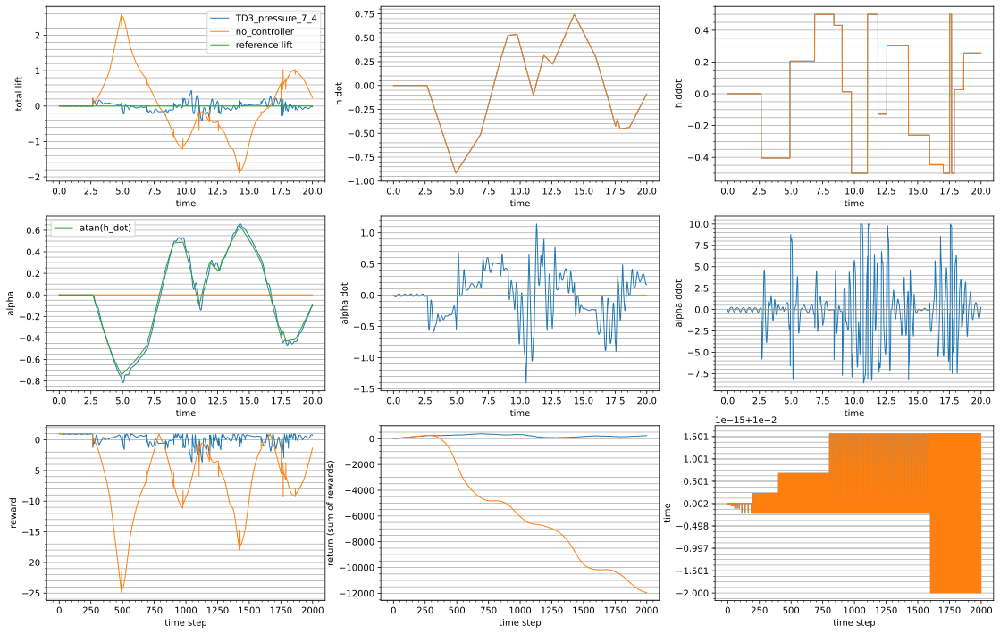

In [41]:
%config InlineBackend.figure_format = 'svg'

fig, axarr = plt.subplots(ncols=3, nrows=3, figsize=(19,12))
axarr[0,0].set_ylabel('total lift')
axarr[0,0].set_xlabel('time')
axarr[0,1].set_ylabel('h dot')
axarr[0,1].set_xlabel('time')
axarr[0,2].set_ylabel('h ddot')
axarr[0,2].set_xlabel('time')
axarr[1,0].set_ylabel('alpha')
axarr[1,0].set_xlabel('time')
axarr[1,1].set_ylabel('alpha dot')
axarr[1,1].set_xlabel('time')
axarr[1,2].set_ylabel('alpha ddot')
axarr[1,2].set_xlabel('time')
axarr[2,0].set_ylabel('reward')
axarr[2,0].set_xlabel('time step')
axarr[2,1].set_ylabel('return (sum of rewards)')
axarr[2,1].set_xlabel('time step')
axarr[2,2].set_ylabel('time')
axarr[2,2].set_xlabel('time step')


for case in cases:
    filepath = writedir + "/" + logdir + "_" + case.name + ".txt"
    print(filepath)
    with open(filepath, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        timestep_hist = [float(x[0]) for x in all_lines]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        reference_lift_list = [float(x[6]) for x in all_lines]
        alpha_ddot_list = [float(x[7]) for x in all_lines]
        fy_hist = [float(x[8]) for x in all_lines]
#         am_list = [math.pi / 4 * (-h_ddot_list[i] - a * alpha_ddot_list[i] + alpha_dot_list[i]) for i in range(len(h_ddot_list))]
        reward_list = [float(x[9]) for x in all_lines]
        episode_return_list = [float(x[10]) for x in all_lines]        
        readFile.close()
        
#     plot_kwargs = {"marker":'o',"linewidth":1,"markersize":2}
    plot_kwargs = {"linewidth":1}
    
    axarr[0,0].plot(t_hist,fy_hist,label=case.name, **plot_kwargs)
    axarr[0,1].plot(t_hist,h_dot_list, **plot_kwargs)
    axarr[0,2].plot(t_hist,h_ddot_list, **plot_kwargs)
    axarr[1,0].plot(t_hist,alpha_list, **plot_kwargs)
    axarr[1,1].plot(t_hist,alpha_dot_list, **plot_kwargs)
    axarr[1,2].plot(t_hist,alpha_ddot_list, **plot_kwargs)
    axarr[2,0].plot(timestep_hist,reward_list, **plot_kwargs)
    axarr[2,1].plot(timestep_hist,episode_return_list, **plot_kwargs)
    axarr[2,2].plot(timestep_hist[:-1],np.diff(t_hist), **plot_kwargs)
    
axarr[0,0].plot(t, generated_reference_lift_list,label="reference lift", **plot_kwargs)
axarr[1,0].plot(t_hist, np.arctan(h_dot_list),label="atan(h_dot)", **plot_kwargs)

axarr[0,0].legend()
axarr[1,0].legend()

for ax in axarr.flatten():
    ax.minorticks_on()
    ax.grid(which='both',axis='y')
    
plt.savefig(writedir + "/" + logdir + "_episode_stats.pdf")

In [29]:
case = cases[0]
filepath = writedir + "/" + logdir + "_" + case.name + ".txt"
print(filepath)
with open(filepath, "r") as readFile:
    textstr = readFile.readlines()
    all_lines = [line.split() for line in textstr]
    timestep_hist = [float(x[0]) for x in all_lines]
    t_hist = [float(x[1]) for x in all_lines]
    h_dot_list = [float(x[2]) for x in all_lines]
    alpha_list = [float(x[3]) for x in all_lines]

policy_evaluation/viscous_flow_test_16_vortex_shedding_TD3_pressure_7_4.txt


In [32]:
np.mean(alpha_list[100:])

-0.049499699999999994

In [42]:
pivot_idx = env.unwrapped.envs[0].jl.eval("g.I0")

/u/home/b/beckers/unsteady_aero_RL/gymnasium_28/env_gymnasium_28/lib/python3.9/site-packages/julia/core.py:709: FutureWarning: Accessing `Julia().<name>` to obtain Julia objects is deprecated.  Use `from julia import Main; Main.<name>` or `jl = Julia(); jl.eval('<name>')`.
  warnings.warn(


In [43]:
nx, ny = env.unwrapped.envs[0].jl.eval("g.N")
ny

52

In [38]:
# %config InlineBackend.figure_format = 'svg'
# import matplotlib
# plt.rcParams["animation.html"] = "jshtml"
# matplotlib.rcParams['image.interpolation'] = 'none'
# case = cases[0]
# render_list = renders_dict[case.name]
# filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
# anim = animaterender_contour(filepath, xg, np.flip(yg), render_list, [0,0], subplot_kw={"ylim":[-0.5,0.5],"xlim":[-1.0,1.75]}, animate_every=3);
# anim

In [1]:
# import matplotlib
# plt.rcParams["animation.html"] = "jshtml"
# matplotlib.rcParams['image.interpolation'] = 'none'
# case = cases[0]
# render_list = renders_dict[case.name]
# filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
# anim = animaterender(filepath, render_list, pivot_idx, subplot_kw={"ylim":[2*ny,-ny],"title":case.name}, fig_kw={}, quiver_kw={"scale":5, "color":"r"}, animate_every=3);
# anim

In [24]:
# import matplotlib
# matplotlib.rcParams['image.interpolation'] = 'none'
# for case in cases:
#     render_list = renders_dict[case.name]
#     filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
#     anim = animaterender(filepath, render_list[1:], pivot_idx, subplot_kw={"ylim":[2*ny,-ny],"title":case.name}, fig_kw={}, quiver_kw={"scale":5, "color":"r"});
#     anim_filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".gif"
#     anim.save(anim_filepath)

In [41]:
import csv

# Convert from whitespace delimiters to comma delimiters
for case in cases:
    infile = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
    outfile = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".csv"
    print(infile)
    with open(infile) as fin, open(outfile, 'w') as fout:
        o=csv.writer(fout)
        for line in fin:
            o.writerow(line.split())

policy_evaluation/TD3_pressure_7_4_constant_array_generator_constant_array_generator.txt
policy_evaluation/no_controller_constant_array_generator_constant_array_generator.txt


In [44]:
xg, yg = env.unwrapped.envs[0].jl.eval("xg, yg = coordinates(vorticity(integrator),g)")

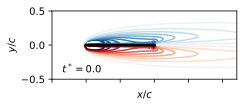

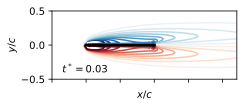

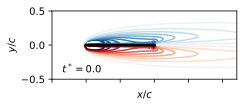

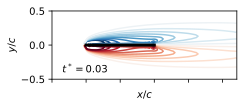

In [37]:
%config InlineBackend.figure_format = 'svg'
figuredir = writedir + "/point_force_figures/"
Path(figuredir).mkdir(parents=True, exist_ok=True)
for case in cases:
    filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
    render_list = renders_dict[case.name]
    with open(filepath, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        alpha_ddot_list = [float(x[6]) for x in all_lines]
        fy_hist = [float(x[7]) for x in all_lines]
        readFile.close()

        for i in [0,1]:#range(0,len(render_list),5):

            fig, ax = plt.subplots(subplot_kw={"ylim":[-0.5,0.5],"xlim":[-1.0,1.75],"xlabel":"$x/c$","ylabel":"$y/c$"},**{"figsize":(3.5,2),"layout":"tight"});  
            cont = ax.contour(xg[3:-3], np.flip(yg[3:-3]), render_list[i][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
            ax.axis('scaled')
            ax.set_xticks([-1,-0.5,0,0.5,1,1.5])
            ax.set_yticks([-0.5,0,0.5])
            for c in cont.collections:
                c.set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
            plate = ax.plot([-0.5,0.5],[0,0],c='black',lw=3)
            plate[0].set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
            text = ax.text(-0.85,-0.4,"$t^* = {t}$".format(t=t_hist[i]))
            plt.savefig(figuredir + "/" + case.name + "_idx_" + str(i) + ".pdf")
            ax.set_xticks([-1,-0.5,0,0.5,1,1.5],[])
            plt.savefig(figuredir + "/" + case.name + "_idx_" + str(i) + ".pdf")

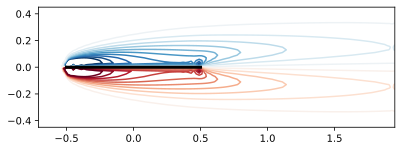

In [49]:
%config InlineBackend.figure_format = 'svg'

import matplotlib
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['image.interpolation'] = 'none'
case = cases[0]
render_list = renders_dict[case.name]
filepath = writedir + "/" + logdir + "_" + case.name + ".txt"
anim = animaterender_contour(filepath, xg, np.flip(yg), render_list, [0,0], subplot_kw={"ylim":case.options_dict["ylim"],"xlim":case.options_dict["xlim"]}, animate_every=10, interval=100, alpha_init=case.options_dict["alpha_init"]);
anim

MovieWriter ffmpeg unavailable; using Pillow instead.
MovieWriter ffmpeg unavailable; using Pillow instead.


policy_evaluation/viscous_flow_test_11_random_ramps_TD3_pressure_7_4.gif
policy_evaluation/viscous_flow_test_11_random_ramps_no_controller.gif


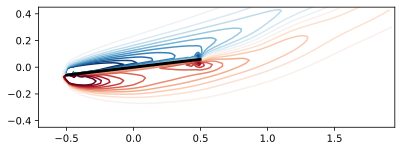

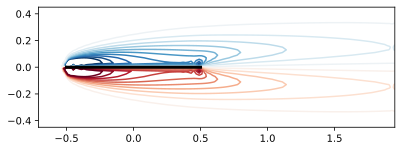

In [52]:
%config InlineBackend.figure_format = 'svg'

import matplotlib
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['image.interpolation'] = 'none'
for case in cases:
    render_list = renders_dict[case.name]
    filepath = writedir + "/" + logdir + "_" + case.name + ".txt"
    anim = animaterender_contour(filepath, xg, np.flip(yg), render_list, [0,0], subplot_kw={"ylim":case.options_dict["ylim"],"xlim":case.options_dict["xlim"]}, animate_every=10, interval=100, alpha_init=case.options_dict["alpha_init"]);
    anim_filepath = writedir + "/" + logdir + "_" + case.name + ".gif"
    anim.save(anim_filepath)
    print(anim_filepath)

MovieWriter ffmpeg unavailable; using Pillow instead.


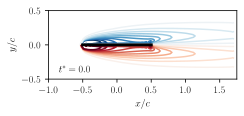

In [308]:
%config InlineBackend.figure_format = 'svg'
import matplotlib
matplotlib.rc('text', usetex = True)
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['image.interpolation'] = 'none'
case = cases[0]
render_list = renders_dict[case.name]
filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
anim = animaterender_contour(filepath, xg, np.flip(yg), render_list, [0,0], subplot_kw={"ylim":[-0.5,0.5],"xlim":[-1.0,1.75],"xlabel":"$x/c$","ylabel":"$y/c$"}, fig_kw={"figsize":(3.5,2),"layout":"tight"},animate_every=3);
anim_filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".gif"
anim.save(anim_filepath)


In [379]:
axarr[1,1]

<Axes: >

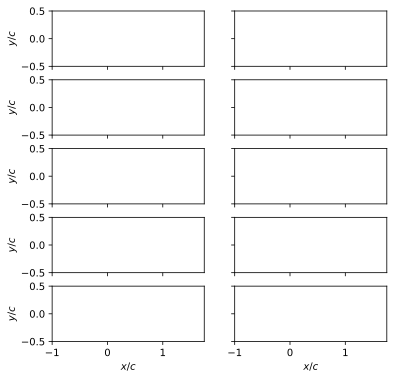

In [33]:
ids = [0,10,20,30,40]
cont_list = []
fig, axarr = plt.subplots(5,2,sharex=True,sharey=True,subplot_kw={"ylim":[-0.5,0.5],"xlim":[-1.0,1.75],"xlabel":"$x/c$","ylabel":"$y/c$"},**{"figsize":(6,6)});  
for ax in axarr.flatten():
    ax.axis('scaled')
    
for column in [0,1]:
    case = cases[column]
    filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
    render_list = renders_dict[case.name]
    with open(filepath, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        alpha_ddot_list = [float(x[6]) for x in all_lines]
        fy_hist = [float(x[7]) for x in all_lines]
        readFile.close()
        
        contours_1 = axarr[0,0].contour(xg[3:-3], np.flip(yg[3:-3]), render_list[ids[0]][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
        for c in contours_1.collections:
            c.set_transform(Affine2D().rotate_deg_around(0,0, 0 * 180 / np.pi) + plt.gca().transData)
        contours_2 = axarr[0,1].contour(xg[3:-3], np.flip(yg[3:-3]), render_list[ids[1]][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
        for c in contours_2.collections:
            c.set_transform(Affine2D().rotate_deg_around(0,0, 0 * 180 / np.pi) + plt.gca().transData)
            
#         for row in [0,1]:
#             i = ids[row]
            
#             contours = axarr[row,column].contour(xg[3:-3], np.flip(yg[3:-3]), render_list[i][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
#             cont_list.append(contours) 
# #             ax.set_xticks([-1,-0.5,0,0.5,1,1.5])
# #             ax.set_yticks([-0.5,0,0.5])
#             for c in cont_list[-1].collections:
#                 c.set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
#             plate = axarr[i,j].plot([-0.5,0.5],[0,0],c='black',lw=3)
#             plate[0].set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
#             text = axarr[i,j].text(-0.85,-0.4,"$t^* = {t}$".format(t=t_hist[i]))

In [ ]:
%config InlineBackend.figure_format = 'svg'



figuredir = writedir + "/point_force_figures/"
Path(figuredir).mkdir(parents=True, exist_ok=True)
for case in cases:
    filepath = writedir + "/" + case.name + "_" + h_ddot_generator.__name__ + "_" + reference_lift_generator.__name__ + ".txt"
    render_list = renders_dict[case.name]
    with open(filepath, "r") as readFile:
        textstr = readFile.readlines()
        all_lines = [line.split() for line in textstr]
        t_hist = [float(x[1]) for x in all_lines]
        h_dot_list = [float(x[2]) for x in all_lines]
        alpha_list = [float(x[3]) for x in all_lines]
        alpha_dot_list = [float(x[4]) for x in all_lines]
        h_ddot_list = [float(x[5]) for x in all_lines]
        alpha_ddot_list = [float(x[6]) for x in all_lines]
        fy_hist = [float(x[7]) for x in all_lines]
        readFile.close()

        for i in range(0,len(render_list),5):

            fig, ax = plt.subplots(subplot_kw={"ylim":[-0.5,0.5],"xlim":[-1.0,1.75],"xlabel":"$x/c$","ylabel":"$y/c$"},**{"figsize":(3.5,2),"layout":"tight"});  
            cont = ax.contour(xg[3:-3], np.flip(yg[3:-3]), render_list[i][3:-3,3:-3,0], np.linspace(-10,10,20), cmap='RdBu_r');
            ax.axis('scaled')
            ax.set_xticks([-1,-0.5,0,0.5,1,1.5])
            ax.set_yticks([-0.5,0,0.5])
            for c in cont.collections:
                c.set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
            plate = ax.plot([-0.5,0.5],[0,0],c='black',lw=3)
            plate[0].set_transform(Affine2D().rotate_deg_around(0,0, -alpha_list[i] * 180 / np.pi) + plt.gca().transData)
            text = ax.text(-0.85,-0.4,"$t^* = {t}$".format(t=t_hist[i]))
#             plt.savefig(figuredir + "/" + case.name + "_idx_" + str(i) + ".pdf")